In [19]:
using DataFrames, CSV, Tables, Dates, Missings, Impute, Plots, Interpolations, Statistics, LinearAlgebra

## Load the data
This was generated with the NOAA web-tool through:

https://www.ncdc.noaa.gov/cdo-web/datatools/lcd

Search for Boston and then download. The current dataset was made small "on-purpose" and only has historical data from 2018-1-1 to sometime in November this year.

In [21]:
df = CSV.File("weather_cleaned_v1.csv", types=Dict(:HourlyDryBulbTemperature=>Float64)) |> DataFrame;

thread = 1 warning: error parsing Float64 on row = 12751, col = 44: "15s,", error=INVALID: OK | SENTINEL | DELIMITED | INVALID_DELIMITER 
thread = 1 warning: error parsing Float64 on row = 22403, col = 44: "72s,", error=INVALID: OK | SENTINEL | DELIMITED | INVALID_DELIMITER 
thread = 1 warning: error parsing Float64 on row = 22406, col = 44: "74s,", error=INVALID: OK | SENTINEL | DELIMITED | INVALID_DELIMITER 
thread = 1 warning: error parsing Float64 on row = 28728, col = 44: "72s,", error=INVALID: OK | SENTINEL | DELIMITED | INVALID_DELIMITER 
thread = 1 warning: error parsing Float64 on row = 30899, col = 44: "66s,", error=INVALID: OK | SENTINEL | DELIMITED | INVALID_DELIMITER 
thread = 1 warning: error parsing Float64 on row = 30900, col = 44: "66s,", error=INVALID: OK | SENTINEL | DELIMITED | INVALID_DELIMITER 
thread = 1 warning: error parsing Float64 on row = 30901, col = 44: "66s,", error=INVALID: OK | SENTINEL | DELIMITED | INVALID_DELIMITER 
thread = 1 warning: error parsing 

## Extract daily and hourly time series of data

In [22]:
dfdaily = filter(row -> strip(row[:REPORT_TYPE]) == "SOD", df);

In [23]:
dfh = filter(row -> !(strip(row[:REPORT_TYPE]) in ["SOD", "SOM"]), df) # these are the entries that correspond to daily and monthly data which we exclude;

## For now only looking at temperature data

In [24]:
temp = Impute.interp(dfh[!, [:DATE,:HourlyDryBulbTemperature]]);

In [11]:
temp

,DATE,HourlyDryBulbTemperature
,DateTime,Float64⍰
1,2018-01-01T00:54:00,2.0
2,2018-01-01T01:00:00,2.0
3,2018-01-01T01:54:00,1.0
4,2018-01-01T02:54:00,1.0
5,2018-01-01T03:54:00,1.0
6,2018-01-01T04:00:00,1.0
7,2018-01-01T04:54:00,0.0
8,2018-01-01T05:54:00,0.0
9,2018-01-01T06:54:00,0.0


In [25]:
temp[!, :HourlyDryBulbTemperature] = convert.(Float64, temp[!, :HourlyDryBulbTemperature]);

In [13]:
temp

,DATE,HourlyDryBulbTemperature
,DateTime,Float64
1,2018-01-01T00:54:00,2.0
2,2018-01-01T01:00:00,2.0
3,2018-01-01T01:54:00,1.0
4,2018-01-01T02:54:00,1.0
5,2018-01-01T03:54:00,1.0
6,2018-01-01T04:00:00,1.0
7,2018-01-01T04:54:00,0.0
8,2018-01-01T05:54:00,0.0
9,2018-01-01T06:54:00,0.0


In [26]:
temp[!, :rounded] = map((d) -> round(d, Dates.Hour), temp[!, :DATE]);

In [33]:
temp[20000,:]

,DATE,HourlyDryBulbTemperature,rounded
,DateTime,Float64,DateTime
20000,2019-06-13T19:54:00,56.0,2019-06-13T20:00:00


## Quick hack for even sampling
https://www.reddit.com/r/Julia/comments/evpofl/resampling_a_dataframe_to_hourly_15min_and_5min/

In [27]:
f(x...) = vcat(x)

f (generic function with 1 method)

In [28]:
temp_even_sampling = by(temp, :rounded, :HourlyDryBulbTemperature => mean);

In [18]:
temp_even_sampling

,rounded,HourlyDryBulbTemperature_mean
,DateTime,Float64
1,2018-01-01T01:00:00,2.0
2,2018-01-01T02:00:00,1.0
3,2018-01-01T03:00:00,1.0
4,2018-01-01T04:00:00,1.0
5,2018-01-01T05:00:00,0.0
6,2018-01-01T06:00:00,0.0
7,2018-01-01T07:00:00,0.0
8,2018-01-01T08:00:00,0.0
9,2018-01-01T09:00:00,1.0


## Lets just look at 72hr of data sometime in summer

In [10]:
d1 = filter(row -> DateTime(2018, 7, 7, 0 ,0)<=row[:rounded]<=DateTime(2018, 7, 10, 0, 0), temp_even_sampling);

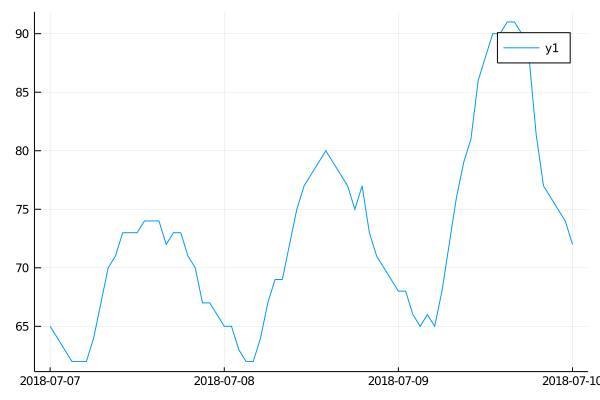

In [11]:
p1=plot(d1[!, :rounded], d1[!, :HourlyDryBulbTemperature_mean])

We can see temperatures mostly go up during the day and come back at night as expected

## Creating the data for training

Running the following code generates quite a big matrix (and actually takes a second or two to run on my computer)

In [12]:
historical_data = 5 # number of days for which we have historical data(at hourly intervals)
t0 = DateTime(2018, 1, 1+historical_data, 0, 0)
training_days = 100
X = zeros(training_days, 24*historical_data)
y = zeros(training_days)
for day=1:training_days
    date = t0 + Day(day)
    X[day, :] = filter(row -> date - Day(historical_data)<= row[:rounded] <= date - Hour(1), temp_even_sampling)[!,:HourlyDryBulbTemperature_mean]
    y[day] = first(filter(row -> floor(row[:DATE], Day)==date, dfdaily))[:DailyAverageDryBulbTemperature]
end

In [20]:
X

100×120 Array{Float64,2}:
  8.0      8.0      8.0   7.0   6.0   …   8.0      8.0   8.0   4.0      2.0
 19.0     18.0     19.0  18.0  18.0      15.0     14.0  13.0  14.0     15.0
 25.0     23.0     23.5  24.0  25.0      33.0     33.0  32.0  32.0     32.0
 24.0     23.0     23.0  22.0  22.0      36.0     35.0  34.0  33.0     32.0
  7.0      7.0      7.0   7.0   7.0      31.0     31.0  32.0  33.0     33.0
  1.0      0.0     -1.0  -2.0  -2.0   …  47.0     47.0  45.0  44.0     46.0
 16.0     19.0     21.0  21.0  21.0      59.0     60.0  60.0  57.75    57.0
 33.0     32.0     32.0  32.0  32.0      27.0     25.0  24.0  23.0     21.0
 32.0     31.0     29.0  28.0  28.0      20.0     19.0  17.0  17.0     16.0
 34.0     34.0     35.0  35.0  34.0      20.0     20.0  20.0  20.0     20.0
 46.0     46.0     44.0  42.0  43.0   …  32.0     32.0  32.0  32.0     32.0
 57.3333  57.6667  58.4  59.0  59.25     32.0     32.0  32.0  32.0     32.0
 19.0     18.0     17.0  16.0  16.0      28.0     28.0  26.0  

In [13]:
(train_X, train_y), (test_X, test_y) = IAI.split_data(:regression, X, y);

In [14]:
grid = IAI.GridSearch(
    IAI.OptimalTreeRegressor(
        random_seed=123,
    ),
    max_depth=1:5,
    #show_progress=false # <-- uncomment to avoid having all the progress bars show up
)
IAI.fit!(grid, train_X, train_y)

Parameter combination...             0%|█               |  ETA: N/A
┌ Warning: This copy of Interpretable AI software is for academic purposes only and not for commercial use.
└ @ IAILicensing C:\Users\iai\builds\InterpretableAI\SysImgBuilder\.julia\packages\IAILicensing\x1CT6\src\precompile.jl:19


2mTraining trees...                    0%|█               |  ETA: N/A

2mTraining trees...                    1%|█               |  ETA: 0:04:37

2mTraining trees...                  100%|████████████████| Time: 0:00:02
Parameter combination...            20%|████            |  ETA: 0:00:31
4m  Parameters:  max_depth=>2

2mTraining trees...                    0%|█               |  ETA: N/A

2mTraining trees...                   53%|█████████       |  ETA: 0:00:00

2mTraining trees...                  100%|████████████████| Time: 0:00:00
Parameter combination...            40%|███████         |  ETA: 0:00:12
4m  Parameters:  max_depth=>3

2mTraining trees...                    0%|█          

Refitting with best parameters...    0%|█               |  ETA: N/A
4m  Parameters:  cp=>0.1615 max_depth=>2

2mTraining trees...                    0%|█               |  ETA: N/A

2mTraining trees...                   43%|███████         |  ETA: 0:00:00

2mTraining trees...                   90%|███████████████ |  ETA: 0:00:00

2mTraining trees...                  100%|████████████████| Time: 0:00:00


Refitting with best parameters...  100%|████████████████| Time: 0:00:00


All Grid Results:

│ Row │ max_depth │ cp        │ train_score │ valid_score │ rank_valid_score │
│     │ Int64     │ Float64   │ Float64     │ Float64     │ Int64            │
├─────┼───────────┼───────────┼─────────────┼─────────────┼──────────────────┤
│ 1   │ 1         │ 0.692867  │ 0.385735    │ -0.251349   │ 5                │
│ 2   │ 2         │ 0.161507  │ 0.704606    │ 0.279455    │ 1                │
│ 3   │ 3         │ 0.074485  │ 0.846984    │ 0.0240407   │ 4                │
│ 4   │ 4         │ 0.116631  │ 0.9329      │ 0.0404424   │ 3                │
│ 5   │ 5         │ 0.0964281 │ 0.983351    │ 0.165369    │ 2                │

Best Params:
  cp => 0.1615065731908933
  max_depth => 2

Best Model - Fitted OptimalTreeRegressor:
  1) Split: x120 < 27.5
    2) Predict: 23.55, 11 points, error 422.7
    3) Split: x120 < 43.5
      4) Predict: 36.5, 50 points, error 1170.5
      5) Predict: 50.56, 9 points, error 248.2

In [15]:
IAI.get_learner(grid)

Fitted OptimalTreeRegressor:
  1) Split: x120 < 27.5
    2) Predict: 23.55, 11 points, error 422.7
    3) Split: x120 < 43.5
      4) Predict: 36.5, 50 points, error 1170.5
      5) Predict: 50.56, 9 points, error 248.2

# Testing

In [18]:
predicted_y = IAI.predict(grid, test_X);
norm(predicted_y - test_y, 2)

36.91968418469921

In [19]:
size(test_y)

(30,)

So each is off by about 6.741 (like on average). I'd say that's not bad, but maybe it could be improved

# Trying to make it hour by hour

In [26]:
historical_data = 5 # number of days for which we have historical data(at hourly intervals)
t0 = DateTime(2018, 1, 1+historical_data, 0, 0)
training_days = 100
X = zeros(24*training_days, 24*historical_data)
y = zeros(24*training_days)
for day=1:training_days
    for hour=0:23
        date = t0 + Day(day) + Hour(hour)
        X[24*(day-1)+hour+1, :] = filter(row -> date - Day(historical_data)<= row[:rounded] <= date - Hour(1), temp_even_sampling)[!,:HourlyDryBulbTemperature_mean]
        y[24*(day-1)+hour+1] = first(filter(row -> row[:rounded]==date, temp_even_sampling))[:HourlyDryBulbTemperature_mean]
    end
end

In [27]:
(train_X, train_y), (test_X, test_y) = IAI.split_data(:regression, X, y);

In [28]:
grid = IAI.GridSearch(
    IAI.OptimalTreeRegressor(
        random_seed=123,
    ),
    max_depth=1:5,
    #show_progress=false # <-- uncomment to avoid having all the progress bars show up
)
IAI.fit!(grid, train_X, train_y)

Parameter combination...             0%|█               |  ETA: N/A
4m  Parameters:  max_depth=>1

2mTraining trees...                    0%|█               |  ETA: N/A

2mTraining trees...                    1%|█               |  ETA: 0:06:28

2mTraining trees...                    6%|█               |  ETA: 0:01:03

2mTraining trees...                   10%|██              |  ETA: 0:00:38

2mTraining trees...                   15%|███             |  ETA: 0:00:24

2mTraining trees...                   20%|████            |  ETA: 0:00:18

2mTraining trees...                   26%|█████           |  ETA: 0:00:13

2mTraining trees...                   32%|██████          |  ETA: 0:00:10

2mTraining trees...                   39%|███████         |  ETA: 0:00:07

2mTraining trees...                   45%|████████        |  ETA: 0:00:06

2mTraining trees...                   51%|█████████       |  ETA: 0:00:05

2mTraining trees...                   57%|██████████      |  ETA: 0:00:04

2mTra

2mTraining trees...                    1%|█               |  ETA: 0:00:30

2mTraining trees...                    2%|█               |  ETA: 0:00:48

2mTraining trees...                    3%|█               |  ETA: 0:00:42

2mTraining trees...                    4%|█               |  ETA: 0:00:40

2mTraining trees...                    5%|█               |  ETA: 0:00:43

2mTraining trees...                    6%|█               |  ETA: 0:00:43

2mTraining trees...                    7%|██              |  ETA: 0:00:44

2mTraining trees...                    8%|██              |  ETA: 0:00:44

2mTraining trees...                    9%|██              |  ETA: 0:00:41

2mTraining trees...                   10%|██              |  ETA: 0:00:41

2mTraining trees...                   11%|██              |  ETA: 0:00:40

2mTraining trees...                   12%|██              |  ETA: 0:00:41

2mTraining trees...                   13%|███             |  ETA: 0:00:39

2mTraining trees...      

2mTraining trees...                   95%|████████████████|  ETA: 0:00:03

2mTraining trees...                   96%|████████████████|  ETA: 0:00:03

2mTraining trees...                   97%|████████████████|  ETA: 0:00:02

2mTraining trees...                   98%|████████████████|  ETA: 0:00:01

2mTraining trees...                   99%|████████████████|  ETA: 0:00:01

2mTraining trees...                  100%|████████████████| Time: 0:01:09
Parameter combination...           100%|████████████████| Time: 0:02:47
Refitting with best parameters...    0%|█               |  ETA: N/A
4m  Parameters:  cp=>0.00155 max_depth=>4



2mTraining trees...                    0%|█               |  ETA: N/A

2mTraining trees...                    1%|█               |  ETA: 0:00:45

2mTraining trees...                    2%|█               |  ETA: 0:00:46

2mTraining trees...                    3%|█               |  ETA: 0:00:46

2mTraining trees...                    4%|█               |  ETA: 0:00:48

2mTraining trees...                    5%|█               |  ETA: 0:00:51

2mTraining trees...                    6%|█               |  ETA: 0:00:51

2mTraining trees...                    7%|██              |  ETA: 0:00:49

2mTraining trees...                    8%|██              |  ETA: 0:00:52

2mTraining trees...                    9%|██              |  ETA: 0:00:49

2mTraining trees...                   10%|██              |  ETA: 0:00:52

2mTraining trees...                   11%|██              |  ETA: 0:00:57

2mTraining trees...                   12%|██              |  ETA: 0:00:56

2mTraining trees...        

All Grid Results:

│ Row │ max_depth │ cp         │ train_score │ valid_score │ rank_valid_score │
│     │ Int64     │ Float64    │ Float64     │ Float64     │ Int64            │
├─────┼───────────┼────────────┼─────────────┼─────────────┼──────────────────┤
│ 1   │ 1         │ 0.264355   │ 0.52871     │ 0.521316    │ 5                │
│ 2   │ 2         │ 0.0569054  │ 0.83349     │ 0.819786    │ 4                │
│ 3   │ 3         │ 0.00972403 │ 0.93346     │ 0.921214    │ 3                │
│ 4   │ 4         │ 0.0015499  │ 0.965076    │ 0.957753    │ 1                │
│ 5   │ 5         │ 1.85922e-5 │ 0.975292    │ 0.956741    │ 2                │

Best Params:
  cp => 0.001549901055525344
  max_depth => 4

Best Model - Fitted OptimalTreeRegressor:
  1) Split: x120 < 36.13
    2) Split: x120 < 24.83
      3) Split: x1 < 11.5
        4) Predict: -0.25, 8 points, error 53.5
        5) Split: x120 < 17.5
          6) Predict: 14.63, 36 points, error 168.8
          7) Predict: 21.94, 9

In [29]:
IAI.get_learner(grid)

Fitted OptimalTreeRegressor:
  1) Split: x120 < 36.13
    2) Split: x120 < 24.83
      3) Split: x1 < 11.5
        4) Predict: -0.25, 8 points, error 53.5
        5) Split: x120 < 17.5
          6) Predict: 14.63, 36 points, error 168.8
          7) Predict: 21.94, 96 points, error 377.8
      8) Split: x120 < 29.8
        9) Predict: 27.24, 153 points, error 532.1
        10) Split: x120 < 33.42
          11) Predict: 31.95, 292 points, error 751.3
          12) Predict: 35.17, 234 points, error 596.4
    13) Split: x120 < 49.25
      14) Split: x120 < 42.12
        15) Split: x120 < 39.42
          16) Predict: 38.02, 293 points, error 839.7
          17) Predict: 40.76, 199 points, error 583.9
        18) Split: x120 < 46.58
          19) Predict: 44.12, 141 points, error 681.1
          20) Predict: 48, 94 points, error 434.6
      21) Split: x120 < 60.67
        22) Split: x120 < 55.5
          23) Predict: 51.78, 75 points, error 542.4
          24) Predict: 57.72, 42 points, error 230.2
        25) Split: x11 < 47
          26) Predict: 66.25, 16 points, error 117
          27) Predict: 48, 1 points, error 0

In [30]:
predicted_y = IAI.predict(grid, test_X);
norm(predicted_y - test_y, 2)

53.922300899771805

In [31]:
size(test_y)

(720,)

So they're off by about 2.010

# What if we have to predict a day before

In [19]:
historical_data = 8 # number of days for which we have historical data(at hourly intervals)
t0 = DateTime(2018, 1, 1+historical_data, 0, 0)
training_days = 100
X = zeros(24*training_days, 24*(historical_data-1));
y = zeros(24*training_days)
for day=1:training_days
    for hour=0:23
        date = t0 + Day(day) + Hour(hour)
        X[24*(day-1)+hour+1, :] = filter(row -> date - Day(historical_data)<= row[:rounded] <= date - Hour(25), temp_even_sampling)[!,:HourlyDryBulbTemperature_mean]
        y[24*(day-1)+hour+1] = first(filter(row -> row[:rounded]==date, temp_even_sampling))[:HourlyDryBulbTemperature_mean]
    end
end

In [20]:
(train_X, train_y), (test_X, test_y) = IAI.split_data(:regression, X, y);

In [21]:
grid = IAI.GridSearch(
    IAI.OptimalTreeRegressor(
        random_seed=123,
    ),
    max_depth=1:5,
    #show_progress=false # <-- uncomment to avoid having all the progress bars show up
)
IAI.fit!(grid, train_X, train_y)

Parameter combination...             0%|█               |  ETA: N/A
4m  Parameters:  max_depth=>1

2mTraining trees...                    0%|█               |  ETA: N/A

2mTraining trees...                    1%|█               |  ETA: 0:05:50

2mTraining trees...                    5%|█               |  ETA: 0:01:10

2mTraining trees...                    8%|██              |  ETA: 0:00:44

2mTraining trees...                   12%|██              |  ETA: 0:00:29

2mTraining trees...                   16%|███             |  ETA: 0:00:21

2mTraining trees...                   20%|████            |  ETA: 0:00:16

2mTraining trees...                   25%|█████           |  ETA: 0:00:13

2mTraining trees...                   30%|█████           |  ETA: 0:00:10

2mTraining trees...                   35%|██████          |  ETA: 0:00:08

2mTraining trees...                   40%|███████         |  ETA: 0:00:07

2mTraining trees...                   45%|████████        |  ETA: 0:00:06

2mTra

2mTraining trees...                   92%|███████████████ |  ETA: 0:00:02

2mTraining trees...                   93%|███████████████ |  ETA: 0:00:02

2mTraining trees...                   94%|████████████████|  ETA: 0:00:01

2mTraining trees...                   95%|████████████████|  ETA: 0:00:01

2mTraining trees...                   96%|████████████████|  ETA: 0:00:01

2mTraining trees...                   97%|████████████████|  ETA: 0:00:01

2mTraining trees...                   98%|████████████████|  ETA: 0:00:00

2mTraining trees...                   99%|████████████████|  ETA: 0:00:00

2mTraining trees...                  100%|████████████████| Time: 0:00:24
Parameter combination...            60%|██████████      |  ETA: 0:00:32
4m  Parameters:  max_depth=>4

2mTraining trees...                    0%|█               |  ETA: N/A

2mTraining trees...                    1%|█               |  ETA: 0:00:37

2mTraining trees...                    2%|█               |  ETA: 0:00:42

2m

2mTraining trees...                   84%|██████████████  |  ETA: 0:00:11

2mTraining trees...                   85%|██████████████  |  ETA: 0:00:11

2mTraining trees...                   86%|██████████████  |  ETA: 0:00:10

2mTraining trees...                   87%|██████████████  |  ETA: 0:00:09

2mTraining trees...                   88%|███████████████ |  ETA: 0:00:08

2mTraining trees...                   89%|███████████████ |  ETA: 0:00:08

2mTraining trees...                   90%|███████████████ |  ETA: 0:00:07

2mTraining trees...                   91%|███████████████ |  ETA: 0:00:06

2mTraining trees...                   92%|███████████████ |  ETA: 0:00:06

2mTraining trees...                   93%|███████████████ |  ETA: 0:00:05

2mTraining trees...                   94%|████████████████|  ETA: 0:00:04

2mTraining trees...                   95%|████████████████|  ETA: 0:00:03

2mTraining trees...                   96%|████████████████|  ETA: 0:00:03

2mTraining trees...      



2mTraining trees...                    0%|█               |  ETA: N/A

2mTraining trees...                    1%|█               |  ETA: 0:01:17

2mTraining trees...                    2%|█               |  ETA: 0:01:19

2mTraining trees...                    3%|█               |  ETA: 0:01:29

2mTraining trees...                    4%|█               |  ETA: 0:01:25

2mTraining trees...                    5%|█               |  ETA: 0:01:26

2mTraining trees...                    6%|█               |  ETA: 0:01:23

2mTraining trees...                    7%|██              |  ETA: 0:01:20

2mTraining trees...                    8%|██              |  ETA: 0:01:19

2mTraining trees...                    9%|██              |  ETA: 0:01:19

2mTraining trees...                   10%|██              |  ETA: 0:01:17

2mTraining trees...                   11%|██              |  ETA: 0:01:16

2mTraining trees...                   12%|██              |  ETA: 0:01:16

2mTraining trees...        

All Grid Results:

│ Row │ max_depth │ cp         │ train_score │ valid_score │ rank_valid_score │
│     │ Int64     │ Float64    │ Float64     │ Float64     │ Int64            │
├─────┼───────────┼────────────┼─────────────┼─────────────┼──────────────────┤
│ 1   │ 1         │ 0.0720795  │ 0.144159    │ 0.149377    │ 5                │
│ 2   │ 2         │ 0.0331718  │ 0.268175    │ 0.234503    │ 4                │
│ 3   │ 3         │ 0.0161388  │ 0.415509    │ 0.309789    │ 3                │
│ 4   │ 4         │ 0.00373157 │ 0.546038    │ 0.321178    │ 2                │
│ 5   │ 5         │ 0.00181148 │ 0.675722    │ 0.373493    │ 1                │

Best Params:
  cp => 0.001811475635851434
  max_depth => 5

Best Model - Fitted OptimalTreeRegressor:
  1) Split: x165 < 35.58
    2) Split: x168 < 26.5
      3) Split: x136 < 42.75
        4) Split: x73 < 38.5
          5) Split: x2 < 46.5
            6) Predict: 27.08, 97 points, error 1914.2
            7) Predict: 39.33, 12 points, er

In [22]:
IAI.get_learner(grid)

Fitted OptimalTreeRegressor:
  1) Split: x165 < 35.58
    2) Split: x168 < 26.5
      3) Split: x136 < 42.75
        4) Split: x73 < 38.5
          5) Split: x2 < 46.5
            6) Predict: 27.08, 97 points, error 1914.2
            7) Predict: 39.33, 12 points, error 119.6
          8) Split: x81 < 34.5
            9) Predict: 44.56, 3 points, error 65.85
            10) Predict: 32.26, 29 points, error 320.8
        11) Predict: 17.26, 26 points, error 229.4
      12) Split: x9 < 40.5
        13) Split: x100 < 42.83
          14) Split: x36 < 42.75
            15) Predict: 34.7, 282 points, error 11295.6
            16) Predict: 26.47, 38 points, error 1043.5
          17) Split: x46 < 33.25
            18) Predict: 37.95, 36 points, error 1014
            19) Predict: 49.01, 16 points, error 277.3
        20) Split: x134 < 31.5
          21) Predict: 44.28, 30 points, error 334.8
          22) Split: x20 < 33.5
            23) Predict: 50.17, 12 points, error 105.7
            24) Predict: 35.13, 113 points, error 2086.1
    25) Split: x168 < 42.75
      26) Split: x101 < 31.75
        27) Split: x47 < 46
          28) Split: x129 < 41.96
            29) Predict: 35.29, 85 points, error 2031.3
            30) Predict: 28.79, 27 points, error 625.1
          31) Predict: 13.1, 10 points, error 76.9
        32) Split: x58 < 34.25
          33) Split: x26 < 30.75
            34) Predict: 29.99, 37 points, error 2412.9
            35) Predict: 37.9, 113 points, error 3684.1
          36) Split: x94 < 32.7
            37) Predict: 49.53, 18 points, error 526.2
            38) Predict: 39.71, 304 points, error 8669
      39) Split: x136 < 40.5
        40) Split: x149 < 40.25
          41) Split: x26 < 29.5
            42) Predict: 54.35, 25 points, error 1552.7
            43) Predict: 41.39, 104 points, error 3423.4
          44) Split: x106 < 28.5
            45) Predict: 34.96, 20 points, error 161.5
            46) Predict: 53.43, 82 points, error 6640.8
        47) Split: x42 < 29
          48) Split: x19 < 9.5
            49) Predict: 16.5, 9 points, error 33
            50) Predict: 27, 11 points, error 92
          51) Split: x98 < 29.5
            52) Predict: 31.09, 17 points, error 95.12
            53) Predict: 41.51, 124 points, error 4645.2

In [23]:
predicted_y = IAI.predict(grid, test_X);
norm(predicted_y - test_y, 2)

190.1791266623071

In [24]:
size(test_y)

(720,)

# Adding in MM/DD/HOUR and minbucket

In [13]:
historical_data = 5 # number of days for which we have historical data(at hourly intervals)
t0 = DateTime(2018, 1, 1+historical_data, 0, 0)
training_days = 360
X = zeros(24*training_days, 24*historical_data + 3)
y = zeros(24*training_days)
for day=1:training_days
    for hour=0:23
        date = t0 + Day(day) + Hour(hour)
        X[24*(day-1)+hour+1, 1:(24*historical_data)] = filter(row -> date - Day(historical_data)<= row[:rounded] <= date - Hour(1), temp_even_sampling)[!,:HourlyDryBulbTemperature_mean]
        X[24*(day-1)+hour+1, 24*historical_data + 1] = Dates.month(date);
        X[24*(day-1)+hour+1, 24*historical_data + 2] = Dates.day(date);
        X[24*(day-1)+hour+1, 24*historical_data + 3] = Dates.hour(date);
        y[24*(day-1)+hour+1] = first(filter(row -> row[:rounded]==date, temp_even_sampling))[:HourlyDryBulbTemperature_mean]
    end
end

In [18]:
(train_X, train_y), (test_X, test_y) = IAI.split_data(:regression, X, y);

In [22]:
grid = IAI.GridSearch(
    IAI.OptimalTreeRegressor(
        random_seed=123,
    ),
    max_depth=1:5,
    minbucket=10:10:100
    #show_progress=false # <-- uncomment to avoid having all the progress bars show up
)
IAI.fit!(grid, train_X, train_y)

Parameter combination...             0%|█               |  ETA: N/A
┌ Warning: This copy of Interpretable AI software is for academic purposes only and not for commercial use.
└ @ IAILicensing C:\Users\iai\builds\InterpretableAI\SysImgBuilder\.julia\packages\IAILicensing\x1CT6\src\precompile.jl:19
┌ Warning: Interpretable AI license expires soon: 2020-12-31. If you need to renew, please send us the following machine ID:
│ b63c67764e000ef33ba99ffe099f97253b3cc710f7860260b4baf656d2fd3734
└ @ IAILicensing C:\Users\iai\builds\InterpretableAI\SysImgBuilder\.julia\packages\IAILicensing\x1CT6\src\precompile.jl:29


2mTraining trees...                    0%|█               |  ETA: N/A

2mTraining trees...                    1%|█               |  ETA: 0:08:25

2mTraining trees...                    3%|█               |  ETA: 0:02:52

2mTraining trees...                    4%|█               |  ETA: 0:02:11

2mTraining trees...                    6%|█               |  ETA: 0:01:28

2mTraining tr

2mTraining trees...                   50%|█████████       |  ETA: 0:00:03

2mTraining trees...                   52%|█████████       |  ETA: 0:00:03

2mTraining trees...                   54%|█████████       |  ETA: 0:00:03

2mTraining trees...                   56%|█████████       |  ETA: 0:00:03

2mTraining trees...                   58%|██████████      |  ETA: 0:00:02

2mTraining trees...                   60%|██████████      |  ETA: 0:00:02

2mTraining trees...                   62%|██████████      |  ETA: 0:00:02

2mTraining trees...                   65%|███████████     |  ETA: 0:00:02

2mTraining trees...                   67%|███████████     |  ETA: 0:00:02

2mTraining trees...                   69%|████████████    |  ETA: 0:00:02

2mTraining trees...                   71%|████████████    |  ETA: 0:00:02

2mTraining trees...                   73%|████████████    |  ETA: 0:00:02

2mTraining trees...                   75%|█████████████   |  ETA: 0:00:01

2mTraining trees...      

2mTraining trees...                   20%|████            |  ETA: 0:00:05

2mTraining trees...                   22%|████            |  ETA: 0:00:05

2mTraining trees...                   24%|████            |  ETA: 0:00:04

2mTraining trees...                   26%|█████           |  ETA: 0:00:04

2mTraining trees...                   28%|█████           |  ETA: 0:00:04

2mTraining trees...                   30%|█████           |  ETA: 0:00:04

2mTraining trees...                   32%|██████          |  ETA: 0:00:04

2mTraining trees...                   34%|██████          |  ETA: 0:00:04

2mTraining trees...                   36%|██████          |  ETA: 0:00:04

2mTraining trees...                   38%|███████         |  ETA: 0:00:04

2mTraining trees...                   40%|███████         |  ETA: 0:00:04

2mTraining trees...                   42%|███████         |  ETA: 0:00:04

2mTraining trees...                   44%|████████        |  ETA: 0:00:04

2mTraining trees...      

2mTraining trees...                   48%|████████        |  ETA: 0:00:16

2mTraining trees...                   49%|████████        |  ETA: 0:00:16

2mTraining trees...                   50%|█████████       |  ETA: 0:00:16

2mTraining trees...                   51%|█████████       |  ETA: 0:00:15

2mTraining trees...                   52%|█████████       |  ETA: 0:00:15

2mTraining trees...                   53%|█████████       |  ETA: 0:00:15

2mTraining trees...                   54%|█████████       |  ETA: 0:00:14

2mTraining trees...                   55%|█████████       |  ETA: 0:00:14

2mTraining trees...                   56%|█████████       |  ETA: 0:00:14

2mTraining trees...                   57%|██████████      |  ETA: 0:00:13

2mTraining trees...                   58%|██████████      |  ETA: 0:00:13

2mTraining trees...                   59%|██████████      |  ETA: 0:00:13

2mTraining trees...                   60%|██████████      |  ETA: 0:00:12

2mTraining trees...      

2mTraining trees...                   40%|███████         |  ETA: 0:00:19

2mTraining trees...                   41%|███████         |  ETA: 0:00:18

2mTraining trees...                   42%|███████         |  ETA: 0:00:18

2mTraining trees...                   43%|███████         |  ETA: 0:00:18

2mTraining trees...                   44%|████████        |  ETA: 0:00:17

2mTraining trees...                   45%|████████        |  ETA: 0:00:17

2mTraining trees...                   46%|████████        |  ETA: 0:00:17

2mTraining trees...                   47%|████████        |  ETA: 0:00:16

2mTraining trees...                   48%|████████        |  ETA: 0:00:16

2mTraining trees...                   49%|████████        |  ETA: 0:00:16

2mTraining trees...                   50%|█████████       |  ETA: 0:00:15

2mTraining trees...                   51%|█████████       |  ETA: 0:00:15

2mTraining trees...                   52%|█████████       |  ETA: 0:00:15

2mTraining trees...      

2mTraining trees...                   32%|██████          |  ETA: 0:00:21

2mTraining trees...                   33%|██████          |  ETA: 0:00:22

2mTraining trees...                   34%|██████          |  ETA: 0:00:21

2mTraining trees...                   35%|██████          |  ETA: 0:00:21

2mTraining trees...                   36%|██████          |  ETA: 0:00:20

2mTraining trees...                   37%|██████          |  ETA: 0:00:20

2mTraining trees...                   38%|███████         |  ETA: 0:00:20

2mTraining trees...                   39%|███████         |  ETA: 0:00:20

2mTraining trees...                   40%|███████         |  ETA: 0:00:20

2mTraining trees...                   41%|███████         |  ETA: 0:00:19

2mTraining trees...                   42%|███████         |  ETA: 0:00:19

2mTraining trees...                   43%|███████         |  ETA: 0:00:18

2mTraining trees...                   44%|████████        |  ETA: 0:00:18

2mTraining trees...      

2mTraining trees...                   24%|████            |  ETA: 0:00:33

2mTraining trees...                   25%|█████           |  ETA: 0:00:33

2mTraining trees...                   26%|█████           |  ETA: 0:00:32

2mTraining trees...                   27%|█████           |  ETA: 0:00:31

2mTraining trees...                   28%|█████           |  ETA: 0:00:31

2mTraining trees...                   29%|█████           |  ETA: 0:00:31

2mTraining trees...                   30%|█████           |  ETA: 0:00:30

2mTraining trees...                   31%|█████           |  ETA: 0:00:31

2mTraining trees...                   32%|██████          |  ETA: 0:00:31

2mTraining trees...                   33%|██████          |  ETA: 0:00:31

2mTraining trees...                   34%|██████          |  ETA: 0:00:31

2mTraining trees...                   35%|██████          |  ETA: 0:00:30

2mTraining trees...                   36%|██████          |  ETA: 0:00:29

2mTraining trees...      

2mTraining trees...                   16%|███             |  ETA: 0:00:26

2mTraining trees...                   17%|███             |  ETA: 0:00:26

2mTraining trees...                   18%|███             |  ETA: 0:00:25

2mTraining trees...                   19%|████            |  ETA: 0:00:25

2mTraining trees...                   20%|████            |  ETA: 0:00:24

2mTraining trees...                   21%|████            |  ETA: 0:00:24

2mTraining trees...                   22%|████            |  ETA: 0:00:23

2mTraining trees...                   23%|████            |  ETA: 0:00:23

2mTraining trees...                   24%|████            |  ETA: 0:00:22

2mTraining trees...                   25%|█████           |  ETA: 0:00:22

2mTraining trees...                   26%|█████           |  ETA: 0:00:22

2mTraining trees...                   27%|█████           |  ETA: 0:00:22

2mTraining trees...                   28%|█████           |  ETA: 0:00:22

2mTraining trees...      

2mTraining trees...                    8%|██              |  ETA: 0:02:04

2mTraining trees...                    9%|██              |  ETA: 0:02:00

2mTraining trees...                   10%|██              |  ETA: 0:02:02

2mTraining trees...                   11%|██              |  ETA: 0:01:58

2mTraining trees...                   12%|██              |  ETA: 0:01:53

2mTraining trees...                   13%|███             |  ETA: 0:01:49

2mTraining trees...                   14%|███             |  ETA: 0:01:45

2mTraining trees...                   15%|███             |  ETA: 0:01:51

2mTraining trees...                   16%|███             |  ETA: 0:01:56

2mTraining trees...                   17%|███             |  ETA: 0:01:53

2mTraining trees...                   18%|███             |  ETA: 0:01:52

2mTraining trees...                   19%|████            |  ETA: 0:01:51

2mTraining trees...                   20%|████            |  ETA: 0:01:48

2mTraining trees...      

2mTraining trees...                    0%|█               |  ETA: N/A

2mTraining trees...                    1%|█               |  ETA: 0:00:59

2mTraining trees...                    2%|█               |  ETA: 0:00:39

2mTraining trees...                    3%|█               |  ETA: 0:00:45

2mTraining trees...                    4%|█               |  ETA: 0:00:47

2mTraining trees...                    5%|█               |  ETA: 0:00:45

2mTraining trees...                    6%|█               |  ETA: 0:00:47

2mTraining trees...                    7%|██              |  ETA: 0:00:44

2mTraining trees...                    8%|██              |  ETA: 0:00:41

2mTraining trees...                    9%|██              |  ETA: 0:00:40

2mTraining trees...                   10%|██              |  ETA: 0:00:40

2mTraining trees...                   11%|██              |  ETA: 0:00:40

2mTraining trees...                   12%|██              |  ETA: 0:00:38

2mTraining trees...          

2mTraining trees...                   94%|████████████████|  ETA: 0:00:02

2mTraining trees...                   95%|████████████████|  ETA: 0:00:02

2mTraining trees...                   96%|████████████████|  ETA: 0:00:02

2mTraining trees...                   97%|████████████████|  ETA: 0:00:01

2mTraining trees...                   98%|████████████████|  ETA: 0:00:01

2mTraining trees...                   99%|████████████████|  ETA: 0:00:00

2mTraining trees...                  100%|████████████████| Time: 0:00:39
Parameter combination...            48%|████████        |  ETA: 0:12:40
4m  Parameters:  minbucket=>50 max_depth=>3

2mTraining trees...                    0%|█               |  ETA: N/A

2mTraining trees...                    1%|█               |  ETA: 0:01:01

2mTraining trees...                    2%|█               |  ETA: 0:00:41

2mTraining trees...                    3%|█               |  ETA: 0:00:49

2mTraining trees...                    4%|█               |  ET

2mTraining trees...                   86%|██████████████  |  ETA: 0:00:05

2mTraining trees...                   87%|██████████████  |  ETA: 0:00:05

2mTraining trees...                   88%|███████████████ |  ETA: 0:00:05

2mTraining trees...                   89%|███████████████ |  ETA: 0:00:04

2mTraining trees...                   90%|███████████████ |  ETA: 0:00:04

2mTraining trees...                   91%|███████████████ |  ETA: 0:00:03

2mTraining trees...                   92%|███████████████ |  ETA: 0:00:03

2mTraining trees...                   93%|███████████████ |  ETA: 0:00:03

2mTraining trees...                   94%|████████████████|  ETA: 0:00:02

2mTraining trees...                   95%|████████████████|  ETA: 0:00:02

2mTraining trees...                   96%|████████████████|  ETA: 0:00:02

2mTraining trees...                   97%|████████████████|  ETA: 0:00:01

2mTraining trees...                   98%|████████████████|  ETA: 0:00:01

2mTraining trees...      

2mTraining trees...                   78%|█████████████   |  ETA: 0:00:08

2mTraining trees...                   79%|█████████████   |  ETA: 0:00:08

2mTraining trees...                   80%|█████████████   |  ETA: 0:00:08

2mTraining trees...                   81%|█████████████   |  ETA: 0:00:07

2mTraining trees...                   82%|██████████████  |  ETA: 0:00:07

2mTraining trees...                   83%|██████████████  |  ETA: 0:00:07

2mTraining trees...                   84%|██████████████  |  ETA: 0:00:06

2mTraining trees...                   85%|██████████████  |  ETA: 0:00:06

2mTraining trees...                   86%|██████████████  |  ETA: 0:00:05

2mTraining trees...                   87%|██████████████  |  ETA: 0:00:05

2mTraining trees...                   88%|███████████████ |  ETA: 0:00:05

2mTraining trees...                   89%|███████████████ |  ETA: 0:00:04

2mTraining trees...                   90%|███████████████ |  ETA: 0:00:04

2mTraining trees...      

2mTraining trees...                   70%|████████████    |  ETA: 0:00:11

2mTraining trees...                   71%|████████████    |  ETA: 0:00:11

2mTraining trees...                   72%|████████████    |  ETA: 0:00:10

2mTraining trees...                   73%|████████████    |  ETA: 0:00:10

2mTraining trees...                   74%|████████████    |  ETA: 0:00:09

2mTraining trees...                   75%|█████████████   |  ETA: 0:00:09

2mTraining trees...                   76%|█████████████   |  ETA: 0:00:09

2mTraining trees...                   77%|█████████████   |  ETA: 0:00:08

2mTraining trees...                   78%|█████████████   |  ETA: 0:00:08

2mTraining trees...                   79%|█████████████   |  ETA: 0:00:08

2mTraining trees...                   80%|█████████████   |  ETA: 0:00:07

2mTraining trees...                   81%|█████████████   |  ETA: 0:00:07

2mTraining trees...                   82%|██████████████  |  ETA: 0:00:07

2mTraining trees...      

2mTraining trees...                   62%|██████████      |  ETA: 0:00:29

2mTraining trees...                   63%|███████████     |  ETA: 0:00:28

2mTraining trees...                   64%|███████████     |  ETA: 0:00:27

2mTraining trees...                   65%|███████████     |  ETA: 0:00:26

2mTraining trees...                   66%|███████████     |  ETA: 0:00:25

2mTraining trees...                   67%|███████████     |  ETA: 0:00:25

2mTraining trees...                   68%|███████████     |  ETA: 0:00:24

2mTraining trees...                   69%|████████████    |  ETA: 0:00:23

2mTraining trees...                   70%|████████████    |  ETA: 0:00:23

2mTraining trees...                   71%|████████████    |  ETA: 0:00:22

2mTraining trees...                   72%|████████████    |  ETA: 0:00:21

2mTraining trees...                   73%|████████████    |  ETA: 0:00:20

2mTraining trees...                   74%|████████████    |  ETA: 0:00:20

2mTraining trees...      

2mTraining trees...                   54%|█████████       |  ETA: 0:00:31

2mTraining trees...                   55%|█████████       |  ETA: 0:00:31

2mTraining trees...                   56%|█████████       |  ETA: 0:00:30

2mTraining trees...                   57%|██████████      |  ETA: 0:00:30

2mTraining trees...                   58%|██████████      |  ETA: 0:00:29

2mTraining trees...                   59%|██████████      |  ETA: 0:00:28

2mTraining trees...                   60%|██████████      |  ETA: 0:00:27

2mTraining trees...                   61%|██████████      |  ETA: 0:00:27

2mTraining trees...                   62%|██████████      |  ETA: 0:00:26

2mTraining trees...                   63%|███████████     |  ETA: 0:00:26

2mTraining trees...                   64%|███████████     |  ETA: 0:00:25

2mTraining trees...                   65%|███████████     |  ETA: 0:00:25

2mTraining trees...                   66%|███████████     |  ETA: 0:00:24

2mTraining trees...      

2mTraining trees...                   46%|████████        |  ETA: 0:00:34

2mTraining trees...                   47%|████████        |  ETA: 0:00:33

2mTraining trees...                   48%|████████        |  ETA: 0:00:33

2mTraining trees...                   49%|████████        |  ETA: 0:00:32

2mTraining trees...                   50%|█████████       |  ETA: 0:00:32

2mTraining trees...                   51%|█████████       |  ETA: 0:00:31

2mTraining trees...                   52%|█████████       |  ETA: 0:00:30

2mTraining trees...                   53%|█████████       |  ETA: 0:00:29

2mTraining trees...                   54%|█████████       |  ETA: 0:00:28

2mTraining trees...                   55%|█████████       |  ETA: 0:00:28

2mTraining trees...                   56%|█████████       |  ETA: 0:00:27

2mTraining trees...                   57%|██████████      |  ETA: 0:00:26

2mTraining trees...                   58%|██████████      |  ETA: 0:00:25

2mTraining trees...      

2mTraining trees...                   38%|███████         |  ETA: 0:00:37

2mTraining trees...                   39%|███████         |  ETA: 0:00:37

2mTraining trees...                   40%|███████         |  ETA: 0:00:36

2mTraining trees...                   41%|███████         |  ETA: 0:00:35

2mTraining trees...                   42%|███████         |  ETA: 0:00:35

2mTraining trees...                   43%|███████         |  ETA: 0:00:34

2mTraining trees...                   44%|████████        |  ETA: 0:00:33

2mTraining trees...                   45%|████████        |  ETA: 0:00:33

2mTraining trees...                   46%|████████        |  ETA: 0:00:32

2mTraining trees...                   47%|████████        |  ETA: 0:00:32

2mTraining trees...                   48%|████████        |  ETA: 0:00:31

2mTraining trees...                   49%|████████        |  ETA: 0:00:31

2mTraining trees...                   50%|█████████       |  ETA: 0:00:30

2mTraining trees...      

2mTraining trees...                   30%|█████           |  ETA: 0:00:46

2mTraining trees...                   31%|█████           |  ETA: 0:00:45

2mTraining trees...                   32%|██████          |  ETA: 0:00:44

2mTraining trees...                   33%|██████          |  ETA: 0:00:43

2mTraining trees...                   34%|██████          |  ETA: 0:00:42

2mTraining trees...                   35%|██████          |  ETA: 0:00:41

2mTraining trees...                   36%|██████          |  ETA: 0:00:40

2mTraining trees...                   37%|██████          |  ETA: 0:00:40

2mTraining trees...                   38%|███████         |  ETA: 0:00:40

2mTraining trees...                   39%|███████         |  ETA: 0:00:39

2mTraining trees...                   40%|███████         |  ETA: 0:00:38

2mTraining trees...                   41%|███████         |  ETA: 0:00:38

2mTraining trees...                   42%|███████         |  ETA: 0:00:37

2mTraining trees...      

2mTraining trees...                   22%|████            |  ETA: 0:01:14

2mTraining trees...                   23%|████            |  ETA: 0:01:13

2mTraining trees...                   24%|████            |  ETA: 0:01:11

2mTraining trees...                   25%|█████           |  ETA: 0:01:10

2mTraining trees...                   26%|█████           |  ETA: 0:01:09

2mTraining trees...                   27%|█████           |  ETA: 0:01:10

2mTraining trees...                   28%|█████           |  ETA: 0:01:10

2mTraining trees...                   29%|█████           |  ETA: 0:01:08

2mTraining trees...                   30%|█████           |  ETA: 0:01:07

2mTraining trees...                   31%|█████           |  ETA: 0:01:07

2mTraining trees...                   32%|██████          |  ETA: 0:01:05

2mTraining trees...                   33%|██████          |  ETA: 0:01:05

2mTraining trees...                   34%|██████          |  ETA: 0:01:04

2mTraining trees...      

2mTraining trees...                   14%|███             |  ETA: 0:01:15

2mTraining trees...                   15%|███             |  ETA: 0:01:16

2mTraining trees...                   16%|███             |  ETA: 0:01:15

2mTraining trees...                   17%|███             |  ETA: 0:01:14

2mTraining trees...                   18%|███             |  ETA: 0:01:12

2mTraining trees...                   19%|████            |  ETA: 0:01:11

2mTraining trees...                   20%|████            |  ETA: 0:01:10

2mTraining trees...                   21%|████            |  ETA: 0:01:09

2mTraining trees...                   22%|████            |  ETA: 0:01:09

2mTraining trees...                   23%|████            |  ETA: 0:01:08

2mTraining trees...                   24%|████            |  ETA: 0:01:07

2mTraining trees...                   25%|█████           |  ETA: 0:01:06

2mTraining trees...                   26%|█████           |  ETA: 0:01:04

2mTraining trees...      

2mTraining trees...                    6%|█               |  ETA: 0:01:25

2mTraining trees...                    7%|██              |  ETA: 0:01:32

2mTraining trees...                    8%|██              |  ETA: 0:01:28

2mTraining trees...                    9%|██              |  ETA: 0:01:25

2mTraining trees...                   10%|██              |  ETA: 0:01:22

2mTraining trees...                   11%|██              |  ETA: 0:01:25

2mTraining trees...                   12%|██              |  ETA: 0:01:27

2mTraining trees...                   13%|███             |  ETA: 0:01:27

2mTraining trees...                   14%|███             |  ETA: 0:01:28

2mTraining trees...                   15%|███             |  ETA: 0:01:30

2mTraining trees...                   16%|███             |  ETA: 0:01:28

2mTraining trees...                   17%|███             |  ETA: 0:01:27

2mTraining trees...                   18%|███             |  ETA: 0:01:25

2mTraining trees...      

2mTraining trees...                  100%|████████████████| Time: 0:01:39
Parameter combination...            94%|████████████████|  ETA: 0:02:26
4m  Parameters:  minbucket=>80 max_depth=>5

2mTraining trees...                    0%|█               |  ETA: N/A

2mTraining trees...                    1%|█               |  ETA: 0:01:19

2mTraining trees...                    2%|█               |  ETA: 0:01:20

2mTraining trees...                    3%|█               |  ETA: 0:01:24

2mTraining trees...                    4%|█               |  ETA: 0:01:21

2mTraining trees...                    5%|█               |  ETA: 0:01:17

2mTraining trees...                    6%|█               |  ETA: 0:01:20

2mTraining trees...                    7%|██              |  ETA: 0:01:23

2mTraining trees...                    8%|██              |  ETA: 0:01:21

2mTraining trees...                    9%|██              |  ETA: 0:01:17

2mTraining trees...                   10%|██              |  ET

2mTraining trees...                   92%|███████████████ |  ETA: 0:00:07

2mTraining trees...                   93%|███████████████ |  ETA: 0:00:06

2mTraining trees...                   94%|████████████████|  ETA: 0:00:05

2mTraining trees...                   95%|████████████████|  ETA: 0:00:04

2mTraining trees...                   96%|████████████████|  ETA: 0:00:04

2mTraining trees...                   97%|████████████████|  ETA: 0:00:03

2mTraining trees...                   98%|████████████████|  ETA: 0:00:02

2mTraining trees...                   99%|████████████████|  ETA: 0:00:01

2mTraining trees...                  100%|████████████████| Time: 0:01:27
Parameter combination...            98%|████████████████|  ETA: 0:00:51
4m  Parameters:  minbucket=>100 max_depth=>5

2mTraining trees...                    0%|█               |  ETA: N/A

2mTraining trees...                    1%|█               |  ETA: 0:01:30

2mTraining trees...                    2%|█               |  E



2mTraining trees...                    0%|█               |  ETA: N/A

2mTraining trees...                    1%|█               |  ETA: 0:02:06

2mTraining trees...                    2%|█               |  ETA: 0:02:34

2mTraining trees...                    3%|█               |  ETA: 0:03:12

2mTraining trees...                    4%|█               |  ETA: 0:03:02

2mTraining trees...                    5%|█               |  ETA: 0:02:54

2mTraining trees...                    6%|█               |  ETA: 0:02:51

2mTraining trees...                    7%|██              |  ETA: 0:02:58

2mTraining trees...                    8%|██              |  ETA: 0:02:51

2mTraining trees...                    9%|██              |  ETA: 0:02:50

2mTraining trees...                   10%|██              |  ETA: 0:02:50

2mTraining trees...                   11%|██              |  ETA: 0:02:46

2mTraining trees...                   12%|██              |  ETA: 0:02:48

2mTraining trees...        

All Grid Results:

│ Row │ minbucket │ max_depth │ cp          │ train_score │ valid_score │
│     │ Int64     │ Int64     │ Float64     │ Float64     │ Float64     │
├─────┼───────────┼───────────┼─────────────┼─────────────┼─────────────┤
│ 1   │ 10        │ 1         │ 0.364806    │ 0.729612    │ 0.722959    │
│ 2   │ 10        │ 2         │ 0.0364775   │ 0.90286     │ 0.896022    │
│ 3   │ 10        │ 3         │ 0.00636526  │ 0.966809    │ 0.964103    │
│ 4   │ 10        │ 4         │ 0.000378143 │ 0.984927    │ 0.982813    │
│ 5   │ 10        │ 5         │ 1.6388e-5   │ 0.989208    │ 0.987115    │
│ 6   │ 20        │ 1         │ 0.364806    │ 0.729612    │ 0.722959    │
│ 7   │ 20        │ 2         │ 0.0364775   │ 0.90286     │ 0.896022    │
│ 8   │ 20        │ 3         │ 0.00636526  │ 0.966809    │ 0.964103    │
│ 9   │ 20        │ 4         │ 0.000378143 │ 0.984848    │ 0.982668    │
│ 10  │ 20        │ 5         │ 5.71683e-5  │ 0.989153    │ 0.987148    │
│ 11  │ 30        │

In [25]:
lnr = IAI.get_learner(grid)

Fitted OptimalTreeRegressor:
  1) Split: x120 < 56.29
    2) Split: x120 < 35.58
      3) Split: x120 < 26.25
        4) Split: x120 < 18.5
          5) Split: x120 < 12.5
            6) Predict: 5.6, 20 points, error 792.8
            7) Predict: 16.08, 59 points, error 198.6
          8) Split: x120 < 22.5
            9) Predict: 20.92, 79 points, error 221.8
            10) Predict: 25.02, 127 points, error 338.9
        11) Split: x120 < 31.17
          12) Split: x120 < 29.8
            13) Predict: 28.03, 149 points, error 381.5
            14) Predict: 30.81, 156 points, error 390.5
          15) Split: x120 < 33.58
            16) Predict: 32.51, 248 points, error 382.9
            17) Predict: 34.41, 221 points, error 336.1
      18) Split: x120 < 44.63
        19) Split: x120 < 39.17
          20) Split: x120 < 37.17
            21) Predict: 36.61, 268 points, error 522.4
            22) Predict: 38.45, 324 points, error 607.2
          23) Split: x120 < 41.75
            24) Predict: 40.49, 266 points, error 545.8
            25) Predict: 43.1, 320 points, error 1081.3
        26) Split: x120 < 49.13
          27) Split: x120 < 47.71
            28) Predict: 45.96, 293 points, error 904.7
            29) Predict: 48.41, 216 points, error 443.9
          30) Split: x120 < 52.29
            31) Predict: 50.83, 293 points, error 805.4
            32) Predict: 54.42, 361 points, error 1747
    33) Split: x120 < 75.13
      34) Split: x120 < 66.1
        35) Split: x120 < 61.9
          36) Split: x120 < 59.88
            37) Predict: 57.94, 286 points, error 1030.3
            38) Predict: 60.61, 163 points, error 529.3
          39) Split: x120 < 63.82
            40) Predict: 62.56, 189 points, error 518.8
            41) Predict: 65.04, 257 points, error 1121.9
        42) Split: x120 < 70.9
          43) Split: x120 < 68.83
            44) Predict: 67.5, 237 points, error 616
            45) Predict: 69.4, 266 points, error 1431.8
          46) Split: x120 < 73.42
            47) Predict: 72.05, 295 points, error 1120.8
            48) Predict: 74.72, 182 points, error 626.3
      49) Split: x120 < 85.75
        50) Split: x120 < 80.42
          51) Split: x120 < 78.38
            52) Predict: 76.84, 241 points, error 1301.3
            53) Predict: 79.19, 148 points, error 930
          54) Split: x123 < 14.5
            55) Predict: 83.44, 119 points, error 657.1
            56) Predict: 81.4, 96 points, error 576.8
        57) Split: x120 < 91.5
          58) Split: x120 < 88.75
            59) Predict: 86.24, 76 points, error 607.2
            60) Predict: 89.14, 47 points, error 312.5
          61) Predict: 93.53, 46 points, error 144

In [27]:
IAI.score(lnr, test_X, test_y)

0.9887738391802318

# Pretty good, but I forgot to make month, day, hour categorical

In [14]:
X2 = convert(DataFrame, X);
categorical!(X2, [:x121, :x122, :x123]);

In [15]:
(train_X, train_y), (test_X, test_y) = IAI.split_data(:regression, X, y);

In [16]:
grid = IAI.GridSearch(
    IAI.OptimalTreeRegressor(
        random_seed=123,
    ),
#     max_depth=1:5,
#     minbucket=10:10:100
    max_depth = 5,
    minbucket = 10
    #show_progress=false # <-- uncomment to avoid having all the progress bars show up
)
IAI.fit!(grid, train_X, train_y)

┌ Warning: This copy of Interpretable AI software is for academic purposes only and not for commercial use.
└ @ IAILicensing C:\Users\iai\builds\InterpretableAI\SysImgBuilder\.julia\packages\IAILicensing\x1CT6\src\precompile.jl:19
┌ Warning: Interpretable AI license expires soon: 2020-12-31. If you need to renew, please send us the following machine ID:
│ b63c67764e000ef33ba99ffe099f97253b3cc710f7860260b4baf656d2fd3734
└ @ IAILicensing C:\Users\iai\builds\InterpretableAI\SysImgBuilder\.julia\packages\IAILicensing\x1CT6\src\precompile.jl:29
Refitting with best parameters...    0%|█               |  ETA: N/A
4m  Parameters:  minbucket=>10 cp=>0.00006876 max_depth=>5



2mTraining trees...                    0%|█               |  ETA: N/A

2mTraining trees...                    1%|█               |  ETA: 0:05:22

2mTraining trees...                    2%|█               |  ETA: 0:06:11

2mTraining trees...                    3%|█               |  ETA: 0:07:00

2mTraining trees...                    4%|█               |  ETA: 0:07:12

2mTraining trees...                    5%|█               |  ETA: 0:07:30

2mTraining trees...                    6%|█               |  ETA: 0:07:20

2mTraining trees...                    7%|██              |  ETA: 0:07:15

2mTraining trees...                    8%|██              |  ETA: 0:06:48

2mTraining trees...                    9%|██              |  ETA: 0:06:38

2mTraining trees...                   10%|██              |  ETA: 0:06:35

2mTraining trees...                   11%|██              |  ETA: 0:06:35

2mTraining trees...                   12%|██              |  ETA: 0:06:25

2mTraining trees...        

All Grid Results:

│ Row │ minbucket │ max_depth │ cp         │ train_score │ valid_score │
│     │ Int64     │ Int64     │ Float64    │ Float64     │ Float64     │
├─────┼───────────┼───────────┼────────────┼─────────────┼─────────────┤
│ 1   │ 10        │ 5         │ 6.87643e-5 │ 0.989842    │ 0.986103    │

│ Row │ rank_valid_score │
│     │ Int64            │
├─────┼──────────────────┤
│ 1   │ 1                │

Best Params:
  minbucket => 10
  cp => 6.876427709070262e-5
  max_depth => 5

Best Model - Fitted OptimalTreeRegressor:
  1) Split: x120 < 57.58
    2) Split: x120 < 37.17
      3) Split: x120 < 26.5
        4) Split: x120 < 17.5
          5) Split: x1 < 13.5
            6) Predict: 1, 10 points, error 134
            7) Predict: 14.92, 56 points, error 194.4
          8) Split: x120 < 22.5
            9) Predict: 20.69, 76 points, error 233.9
            10) Predict: 25.01, 136 points, error 405
        11) Split: x120 < 32.23
          12) Split: x120 < 29.5
            

In [17]:
lnr = IAI.get_learner(grid)

Fitted OptimalTreeRegressor:
  1) Split: x120 < 57.58
    2) Split: x120 < 37.17
      3) Split: x120 < 26.5
        4) Split: x120 < 17.5
          5) Split: x1 < 13.5
            6) Predict: 1, 10 points, error 134
            7) Predict: 14.92, 56 points, error 194.4
          8) Split: x120 < 22.5
            9) Predict: 20.69, 76 points, error 233.9
            10) Predict: 25.01, 136 points, error 405
        11) Split: x120 < 32.23
          12) Split: x120 < 29.5
            13) Predict: 28.13, 158 points, error 375.8
            14) Predict: 31.39, 273 points, error 650.7
          15) Split: x120 < 34.13
            16) Predict: 33.55, 266 points, error 433.7
            17) Predict: 36.16, 382 points, error 870.8
      18) Split: x120 < 47.71
        19) Split: x120 < 42.58
          20) Split: x120 < 39.58
            21) Predict: 38.5, 321 points, error 862.7
            22) Predict: 40.88, 358 points, error 833
          23) Split: x120 < 44.7
            24) Predict: 43.58, 197 points, error 602.5
            25) Predict: 45.96, 302 points, error 1041
        26) Split: x120 < 52.17
          27) Split: x120 < 49.13
            28) Predict: 48.4, 232 points, error 580.1
            29) Predict: 50.92, 303 points, error 812.6
          30) Split: x120 < 55.13
            31) Predict: 54.1, 259 points, error 1039.7
            32) Predict: 56.65, 150 points, error 547.7
    33) Split: x120 < 73.17
      34) Split: x120 < 66.1
        35) Split: x120 < 61.12
          36) Split: x120 < 59.75
            37) Predict: 58.48, 179 points, error 450.5
            38) Predict: 60.43, 169 points, error 525
          39) Split: x120 < 63.82
            40) Predict: 62.58, 189 points, error 438.3
            41) Predict: 64.97, 240 points, error 1061.5
        42) Split: x120 < 69.1
          43) Predict: 67.85, 365 points, error 1531.9
          44) Split: x120 < 70.29
            45) Predict: 69.97, 154 points, error 524.9
            46) Predict: 72.02, 308 points, error 1100.7
      47) Split: x120 < 85.75
        48) Split: x120 < 78.75
          49) Split: x120 < 75.58
            50) Predict: 74.5, 204 points, error 1100.1
            51) Predict: 76.88, 229 points, error 1100.7
          52) Split: x120 < 81.42
            53) Predict: 79.58, 189 points, error 1135.3
            54) Predict: 83.1, 192 points, error 1321.7
        55) Split: x120 < 92.5
          56) Split: x120 < 88.5
            57) Predict: 86.67, 64 points, error 417.7
            58) Predict: 89.44, 50 points, error 395.6
          59) Predict: 94.04, 37 points, error 125.2

In [18]:
IAI.score(lnr, test_X, test_y)

0.9887321964661999

# Load the test data

In [36]:
historical_data = 5 # number of days for which we have historical data(at hourly intervals)
t0 = DateTime(2019, 1, 1+historical_data, 0, 0)
training_days = 270
X = zeros(24*training_days, 24*historical_data + 3)
y = zeros(24*training_days)
for day=1:training_days
    for hour=0:23
        date = t0 + Day(day) + Hour(hour)
        X[24*(day-1)+hour+1, 1:(24*historical_data)] = filter(row -> date - Day(historical_data)<= row[:rounded] <= date - Hour(1), temp_even_sampling)[!,:HourlyDryBulbTemperature_mean]
        X[24*(day-1)+hour+1, 24*historical_data + 1] = Dates.month(date);
        X[24*(day-1)+hour+1, 24*historical_data + 2] = Dates.day(date);
        X[24*(day-1)+hour+1, 24*historical_data + 3] = Dates.hour(date);
        y[24*(day-1)+hour+1] = first(filter(row -> row[:rounded]==date, temp_even_sampling))[:HourlyDryBulbTemperature_mean]
    end
end

In [37]:
X2 = convert(DataFrame, X);
categorical!(X2, [:x121, :x122, :x123]);

In [38]:
(train_X, train_y), (test_X, test_y) = IAI.split_data(:regression, X, y);

In [39]:
IAI.score(lnr, test_X, test_y)

0.9888596702015169

# Copying some things from Johannes

In [12]:
function clean(x)
    if ismissing(x) || x isa Float64
        return x
    end
    m = match(r"[+-]?([0-9]*[.])?[0-9]+",x)
    return m ==nothing ? missing : parse(Float64, m.match)
    end;

In [13]:
function resample(dfh, factor)
    dfh[!,factor] = clean.(dfh[:,factor])
    timeseries = Impute.interp(dfh[!, [:DATE, factor]]) |> Impute.locf() |> Impute.nocb() 
    timeseries[!, factor] = convert.(Float64, timeseries[!, factor]) # remove the missing type
    # even sampling
    timeseries[!, :rounded] = map((d) -> round(d, Dates.Hour), timeseries[!, :DATE])
    even_sampling = by(timeseries, :rounded, factor => mean)
    rename!(even_sampling, Symbol(factor, "_mean") => :data)
    return even_sampling
    end;

In [14]:
monthdayhour = x -> [Dates.month(x) Dates.day(x) Dates.hour(x)];

In [15]:
function build_data(dataseries, start, dayslookback, ndays; offset=1)
    year, month, startday = start
    additional_factors = 3                    # for month, day, hour info
    historical_factors = 24*dayslookback
    total_factors = historical_factors + additional_factors
    n_datapoints = 24*ndays
    X = zeros(n_datapoints, total_factors)
    y = zeros(n_datapoints)
    t0 = DateTime(year, month, startday, 0, 0)
    dateidx = findall(x -> x== t0, dataseries[:, :rounded])[1];
    hist = temp[dateidx:dateidx+historical_factors-1,:data]'
    for idx=1:n_datapoints
        next_point = dateidx+historical_factors+idx
        predict = next_point+offset-1
        predict_date = dataseries[predict,:rounded]
        X[idx, 1:total_factors] = [hist monthdayhour(predict_date)]
        y[idx] = dataseries[predict,:data]
        hist = [hist[2:end]' dataseries[next_point,:data]]
    end
    return X,y
end

build_data (generic function with 1 method)

In [16]:
df = CSV.File("boston.csv") |> DataFrame;
dfdaily = filter(row -> strip(row[:REPORT_TYPE]) == "SOD", df);
dfh = filter(row -> !(strip(row[:REPORT_TYPE]) in ["SOD", "SOM"]), df) # these are the entries that correspond to daily and monthly data which we exclude;
factors = [:HourlyDryBulbTemperature, :HourlyPrecipitation, :HourlySeaLevelPressure];
temp = resample(dfh, :HourlyDryBulbTemperature)
prec = resample(dfh, :HourlyPrecipitation)
pres = resample(dfh, :HourlySeaLevelPressure);

In [17]:
start = 2018, 1, 3
dayslookback = 2;
ndays = 360;
X, y = build_data(temp, start, dayslookback, ndays; offset=24);
(train_X, train_y), (test_X, test_y) = IAI.split_data(:regression, X, y);

In [ ]:
df_X = DataFrame()
for i = 1:(size(X, 1) - 3)
    hours_before = size(X, 1) - 2 - i
    parameter_string = (floor(hours_before / 24), " days and ", mod(hours_before, 24), " hours")
    df_X[:parameter_string] = []
end

In [28]:
grid = IAI.GridSearch(
    IAI.OptimalTreeRegressor(
        random_seed=123,
    ),
#     max_depth=1:5,
#     minbucket=10:10:100
    max_depth = 1:5,
    minbucket = 10
    #show_progress=false # <-- uncomment to avoid having all the progress bars show up
)
IAI.fit!(grid, train_X, train_y)

Parameter combination...             0%|█               |  ETA: N/A
4m  Parameters:  minbucket=>10 max_depth=>1

2mTraining trees...                    0%|█               |  ETA: N/A

2mTraining trees...                    1%|█               |  ETA: 0:01:51

2mTraining trees...                   13%|███             |  ETA: 0:00:08

2mTraining trees...                   24%|████            |  ETA: 0:00:04

2mTraining trees...                   35%|██████          |  ETA: 0:00:03

2mTraining trees...                   46%|████████        |  ETA: 0:00:02

2mTraining trees...                   57%|██████████      |  ETA: 0:00:01

2mTraining trees...                   68%|███████████     |  ETA: 0:00:01

2mTraining trees...                   79%|█████████████   |  ETA: 0:00:00

2mTraining trees...                   90%|███████████████ |  ETA: 0:00:00

2mTraining trees...                  100%|████████████████| Time: 0:00:02
Parameter combination...            20%|████            |  ETA: 0:0

2mTraining trees...                   90%|███████████████ |  ETA: 0:00:02

2mTraining trees...                   91%|███████████████ |  ETA: 0:00:02

2mTraining trees...                   92%|███████████████ |  ETA: 0:00:02

2mTraining trees...                   93%|███████████████ |  ETA: 0:00:01

2mTraining trees...                   94%|████████████████|  ETA: 0:00:01

2mTraining trees...                   95%|████████████████|  ETA: 0:00:01

2mTraining trees...                   96%|████████████████|  ETA: 0:00:01

2mTraining trees...                   97%|████████████████|  ETA: 0:00:01

2mTraining trees...                   98%|████████████████|  ETA: 0:00:00

2mTraining trees...                   99%|████████████████|  ETA: 0:00:00

2mTraining trees...                  100%|████████████████| Time: 0:00:18
Parameter combination...            80%|█████████████   |  ETA: 0:00:09
4m  Parameters:  minbucket=>10 max_depth=>5

2mTraining trees...                    0%|█               |



2mTraining trees...                    0%|█               |  ETA: N/A

2mTraining trees...                    1%|█               |  ETA: 0:00:37

2mTraining trees...                    2%|█               |  ETA: 0:00:34

2mTraining trees...                    3%|█               |  ETA: 0:00:34

2mTraining trees...                    4%|█               |  ETA: 0:00:37

2mTraining trees...                    5%|█               |  ETA: 0:00:37

2mTraining trees...                    6%|█               |  ETA: 0:00:37

2mTraining trees...                    7%|██              |  ETA: 0:00:36

2mTraining trees...                    8%|██              |  ETA: 0:00:34

2mTraining trees...                    9%|██              |  ETA: 0:00:34

2mTraining trees...                   10%|██              |  ETA: 0:00:33

2mTraining trees...                   11%|██              |  ETA: 0:00:32

2mTraining trees...                   12%|██              |  ETA: 0:00:32

2mTraining trees...        

All Grid Results:

│ Row │ minbucket │ max_depth │ cp          │ train_score │ valid_score │
│     │ Int64     │ Int64     │ Float64     │ Float64     │ Float64     │
├─────┼───────────┼───────────┼─────────────┼─────────────┼─────────────┤
│ 1   │ 10        │ 1         │ 0.308532    │ 0.617064    │ 0.591641    │
│ 2   │ 10        │ 2         │ 0.0232649   │ 0.747543    │ 0.730518    │
│ 3   │ 10        │ 3         │ 0.0057054   │ 0.803858    │ 0.787433    │
│ 4   │ 10        │ 4         │ 0.00127506  │ 0.82633     │ 0.805214    │
│ 5   │ 10        │ 5         │ 0.000490677 │ 0.84902     │ 0.816952    │

│ Row │ rank_valid_score │
│     │ Int64            │
├─────┼──────────────────┤
│ 1   │ 5                │
│ 2   │ 4                │
│ 3   │ 3                │
│ 4   │ 2                │
│ 5   │ 1                │

Best Params:
  minbucket => 10
  cp => 0.0004906767990793259
  max_depth => 5

Best Model - Fitted OptimalTreeRegressor:
  1) Split: x47 < 54.63
    2) Split: x48 < 42.58


In [29]:
lnr = IAI.get_learner(grid)

Fitted OptimalTreeRegressor:
  1) Split: x47 < 54.63
    2) Split: x48 < 42.58
      3) Split: x50 < 7.5
        4) Split: x1 < 30.25
          5) Split: x49 < 1.5
            6) Predict: 7.909, 33 points, error 914.7
            7) Predict: 26.67, 71 points, error 4133.9
          8) Split: x50 < 4.5
            9) Predict: 40.56, 151 points, error 4816.1
            10) Predict: 35.52, 165 points, error 3025.9
        11) Split: x5 < 45.75
          12) Split: x48 < 27.5
            13) Predict: 29.2, 236 points, error 9151.7
            14) Predict: 36.86, 1109 points, error 60509.8
          15) Split: x49 < 1.5
            16) Predict: 23.46, 64 points, error 2834.8
            17) Predict: 40.42, 233 points, error 11660
      18) Split: x1 < 49.25
        19) Split: x17 < 47.25
          20) Split: x14 < 42.5
            21) Predict: 45.38, 400 points, error 26635.5
            22) Predict: 41.6, 138 points, error 5871.1
          23) Split: x48 < 50.17
            24) Predict: 43.8, 139 points, error 7668.8
            25) Predict: 53.72, 46 points, error 3107.3
        26) Split: x1 < 55.67
          27) Split: x45 < 44.5
            28) Predict: 43.54, 26 points, error 1308
            29) Predict: 52.12, 213 points, error 13048.4
          30) Split: x50 < 15.5
            31) Predict: 53.46, 174 points, error 5782.6
            32) Predict: 61.04, 93 points, error 6995.5
    33) Split: x8 < 62.17
      34) Split: x49 < 5.5
        35) Split: x49 < 2.5
          36) Split: x14 < 36
            37) Predict: 56.82, 11 points, error 2647.6
            38) Predict: 27.69, 28 points, error 2223.8
          39) Split: x49 < 4.5
            40) Predict: 49.18, 71 points, error 2517
            41) Predict: 62.71, 236 points, error 26690.6
        42) Split: x1 < 51.23
          43) Split: x50 < 2.5
            44) Predict: 62, 19 points, error 957.6
            45) Predict: 48.71, 76 points, error 2986.6
          46) Split: x49 < 9.5
            47) Predict: 69.7, 223 points, error 8316.3
            48) Predict: 61.5, 171 points, error 10511.1
      49) Split: x48 < 72.58
        50) Split: x48 < 69.23
          51) Split: x48 < 62.42
            52) Predict: 61.04, 281 points, error 16555.7
            53) Predict: 66.96, 442 points, error 12843.1
          54) Split: x1 < 63.83
            55) Predict: 61.6, 36 points, error 1516.8
            56) Predict: 72.25, 257 points, error 9538.1
        57) Split: x48 < 81.75
          58) Split: x49 < 6.5
            59) Predict: 72.17, 85 points, error 5363.7
            60) Predict: 77.1, 531 points, error 19510
          61) Split: x19 < 89.5
            62) Predict: 82.34, 267 points, error 13583.7
            63) Predict: 74.86, 23 points, error 811.6

In [30]:
IAI.score(lnr, test_X, test_y)  # Testing on the same year

0.819025388702224

In [33]:
start = 2019, 1, 3
dayslookback = 2;
ndays = 360;
X2, y2 = build_data(temp, start, dayslookback, ndays; offset=24);
(train_X2, train_y2), (test_X2, test_y2) = IAI.split_data(:regression, X, y);

In [34]:
IAI.score(lnr, test_X2, test_y2)  # Testing on the next year

0.7905675857121075

# Now with hyperplanes

In [37]:
grid = IAI.GridSearch(
    IAI.OptimalTreeRegressor(
        random_seed=123,
        hyperplane_config=(sparsity=:all,)
    ),
    max_depth=1:5,
    minbucket=10
)
IAI.fit!(grid, train_X, train_y)

Parameter combination...             0%|█               |  ETA: N/A
4m  Parameters:  minbucket=>10 max_depth=>1

2mTraining trees...                    0%|█               |  ETA: N/A

2mTraining trees...                    1%|█               |  ETA: 0:02:18

2mTraining trees...                    2%|█               |  ETA: 0:01:59

2mTraining trees...                    3%|█               |  ETA: 0:01:39

2mTraining trees...                    4%|█               |  ETA: 0:01:33

2mTraining trees...                    5%|█               |  ETA: 0:01:50

2mTraining trees...                    6%|█               |  ETA: 0:01:45

2mTraining trees...                    7%|██              |  ETA: 0:01:52

2mTraining trees...                    8%|██              |  ETA: 0:01:57

2mTraining trees...                    9%|██              |  ETA: 0:01:58

2mTraining trees...                   10%|██              |  ETA: 0:02:00

2mTraining trees...                   11%|██              |  ETA: 

2mTraining trees...                   93%|███████████████ |  ETA: 0:00:31

2mTraining trees...                   94%|████████████████|  ETA: 0:00:26

2mTraining trees...                   95%|████████████████|  ETA: 0:00:22

2mTraining trees...                   96%|████████████████|  ETA: 0:00:17

2mTraining trees...                   97%|████████████████|  ETA: 0:00:13

2mTraining trees...                   98%|████████████████|  ETA: 0:00:09

2mTraining trees...                   99%|████████████████|  ETA: 0:00:04

2mTraining trees...                  100%|████████████████| Time: 0:07:14
Parameter combination...            40%|███████         |  ETA: 0:14:12
4m  Parameters:  minbucket=>10 max_depth=>3

2mTraining trees...                    0%|█               |  ETA: N/A

2mTraining trees...                    1%|█               |  ETA: 0:16:20

2mTraining trees...                    2%|█               |  ETA: 0:18:57

2mTraining trees...                    3%|█               |  ET

2mTraining trees...                   85%|██████████████  |  ETA: 0:04:42

2mTraining trees...                   86%|██████████████  |  ETA: 0:04:25

2mTraining trees...                   87%|██████████████  |  ETA: 0:04:06

2mTraining trees...                   88%|███████████████ |  ETA: 0:03:48

2mTraining trees...                   89%|███████████████ |  ETA: 0:03:29

2mTraining trees...                   90%|███████████████ |  ETA: 0:03:10

2mTraining trees...                   91%|███████████████ |  ETA: 0:02:52

2mTraining trees...                   92%|███████████████ |  ETA: 0:02:33

2mTraining trees...                   93%|███████████████ |  ETA: 0:02:14

2mTraining trees...                   94%|████████████████|  ETA: 0:01:55

2mTraining trees...                   95%|████████████████|  ETA: 0:01:35

2mTraining trees...                   96%|████████████████|  ETA: 0:01:17

2mTraining trees...                   97%|████████████████|  ETA: 0:00:58

2mTraining trees...      



2mTraining trees...                    0%|█               |  ETA: N/A

2mTraining trees...                    1%|█               |  ETA: 0:57:44

2mTraining trees...                    2%|█               |  ETA: 1:32:29

2mTraining trees...                    3%|█               |  ETA: 1:16:01

2mTraining trees...                    4%|█               |  ETA: 1:21:21

2mTraining trees...                    5%|█               |  ETA: 1:11:19

2mTraining trees...                    6%|█               |  ETA: 1:10:17

2mTraining trees...                    7%|██              |  ETA: 1:04:16

2mTraining trees...                    8%|██              |  ETA: 1:02:55

2mTraining trees...                    9%|██              |  ETA: 1:00:26

2mTraining trees...                   10%|██              |  ETA: 0:58:06

2mTraining trees...                   11%|██              |  ETA: 0:57:40

2mTraining trees...                   12%|██              |  ETA: 0:58:17

2mTraining trees...        

All Grid Results:

│ Row │ minbucket │ max_depth │ cp         │ train_score │ valid_score │
│     │ Int64     │ Int64     │ Float64    │ Float64     │ Float64     │
├─────┼───────────┼───────────┼────────────┼─────────────┼─────────────┤
│ 1   │ 10        │ 1         │ 0.0114168  │ 0.663438    │ 0.635348    │
│ 2   │ 10        │ 2         │ 0.00116231 │ 0.769392    │ 0.748545    │
│ 3   │ 10        │ 3         │ 4.74404e-5 │ 0.816322    │ 0.798175    │
│ 4   │ 10        │ 4         │ 4.44479e-5 │ 0.851323    │ 0.824206    │
│ 5   │ 10        │ 5         │ 8.28342e-6 │ 0.881303    │ 0.838481    │

│ Row │ rank_valid_score │
│     │ Int64            │
├─────┼──────────────────┤
│ 1   │ 5                │
│ 2   │ 4                │
│ 3   │ 3                │
│ 4   │ 2                │
│ 5   │ 1                │

Best Params:
  minbucket => 10
  cp => 8.283420821449041e-6
  max_depth => 5

Best Model - Fitted OptimalTreeRegressor:
  1) Split: 0.009617 * x1 + 0.00687 * x2 + 0.006709 * x4 + 

In [38]:
lnr = IAI.get_learner(grid)

Fitted OptimalTreeRegressor:
  1) Split: 0.009617 * x1 + 0.00687 * x2 + 0.006709 * x4 + 0.003804 * x7 + 0.008868 * x11 + 0.006822 * x15 + 0.001591 * x20 + 0.008323 * x21 + 0.005921 * x22 + 0.007322 * x32 + 0.009673 * x35 + 0.00875 * x36 + 0.008825 * x39 + 0.005175 * x42 + 0.004925 * x45 + 0.004731 * x47 + 0.06421 * x49 - 0.02172 * x50 - 0.0007165 * x51 < 5.964
    2) Split: 0.004891 * x1 + 0.003334 * x2 + 0.001047 * x4 - 0.007885 * x7 - 0.001968 * x15 + 0.001036 * x16 + 0.005605 * x17 + 0.007119 * x33 + 0.00443 * x45 + 0.002235 * x46 + 0.007976 * x47 + 0.006175 * x48 + 0.01007 * x49 + 0.002575 * x50 - 0.0005579 * x51 < 1.437
      3) Split: -0.002577 * x5 + 0.00004759 * x9 - 0.003741 * x17 - 0.001246 * x35 - 0.0007581 * x40 + 0.0241 * x47 + 0.009935 * x48 - 0.01979 * x49 + 0.002434 * x51 < 0.6215
        4) Split: 0.009196 * x1 + 0.009126 * x8 + 0.007724 * x14 + 0.002984 * x48 - 2.197 * x49 - 0.03102 * x50 < -1.894
          5) Split: 0.02441 * x1 + 0.0127 * x4 + 0.008982 * x5 + 0.02895 * x9 - 0.01734 * x16 - 0.02536 * x26 - 0.02179 * x40 - 0.006575 * x44 + 0.02023 * x48 + 0.07372 * x49 - 0.02835 * x50 + 0.004673 * x51 < 1.529
            6) Predict: 28.52, 251 points, error 9636.2
            7) Predict: 36.28, 116 points, error 3144.6
          8) Split: 0.00185 * x1 + 0.0004552 * x44 < 0.05243
            9) Predict: 4.478, 23 points, error 389.7
            10) Predict: 18.17, 55 points, error 786.5
        11) Split: 0.006393 * x3 + 0.01009 * x5 + 0.003715 * x6 + 0.0061 * x9 + 0.006199 * x10 + 0.009656 * x12 + 0.009237 * x15 - 0.00311 * x24 - 0.002158 * x26 - 0.006863 * x31 + 0.00993 * x47 - 0.005931 * x49 + 0.04218 * x50 < 1.821
          12) Split: 0.0101 * x39 - 0.0003742 * x48 - 0.02448 * x50 < 0.2794
            13) Predict: 32.14, 156 points, error 4214.6
            14) Predict: 13.81, 16 points, error 238.4
          15) Split: -0.0004498 * x1 - 0.0006249 * x3 - 0.0006979 * x5 - 0.0002004 * x7 + 0.004238 * x15 + 0.01335 * x17 + 0.0007809 * x27 - 0.0005632 * x39 - 0.0002631 * x49 + 0.0007772 * x50 - 0.002334 * x51 < 0.47
            16) Predict: 43.79, 209 points, error 6543.1
            17) Predict: 36.5, 804 points, error 34010.5
      18) Split: 0.00831 * x6 + 0.005511 * x7 + 0.006571 * x10 + 0.004861 * x21 + 0.007563 * x26 + 0.005786 * x44 + 0.006136 * x48 - 0.03429 * x49 - 0.02318 * x50 + 0.004105 * x51 < 1.668
        19) Split: -0.000001886 * x25 - 0.00265 * x49 - 0.000006374 * x50 < -0.02931
          20) Split: 0.007362 * x1 + 0.006505 * x5 + 0.01004 * x9 + 0.008619 * x13 + 0.003274 * x14 + 0.008296 * x16 + 0.00955 * x19 + 0.008439 * x20 + 0.009676 * x37 + 0.0004943 * x39 + 0.003502 * x41 + 0.01927 * x50 < 3.237
            21) Predict: 47.82, 98 points, error 3379.8
            22) Predict: 36.29, 311 points, error 10390.7
          23) Split: 0.008523 * x2 + 0.0002286 * x9 + 0.001019 * x12 + 0.002053 * x13 - 0.004677 * x17 + 0.008869 * x24 + 0.004816 * x25 - 0.01393 * x31 - 0.008964 * x33 - 0.005059 * x36 + 0.00546 * x37 + 0.004053 * x43 + 0.003942 * x44 + 0.003251 * x46 + 0.005163 * x48 - 0.001461 * x49 + 0.01121 * x50 < 1.014
            24) Predict: 44.5, 561 points, error 32845.8
            25) Predict: 51.6, 220 points, error 8345.9
        26) Split: 0.0003137 * x47 + 0.0446 * x49 + 0.001521 * x50 < 0.2297
          27) Split: 0.008253 * x28 + 0.4046 * x49 < 1.139
            28) Predict: 21.29, 19 points, error 555.7
            29) Predict: 40.42, 124 points, error 5165.5
          30) Split: 0.009314 * x3 + 0.009371 * x15 + 0.0001486 * x32 - 0.001222 * x48 + 0.04509 * x49 + 0.00636 * x50 < 1.16
            31) Predict: 74.13, 27 points, error 2168.7
            32) Predict: 59.19, 245 points, error 12812.6
    33) Split: 0.008592 * x2 - 0.00024 * x5 - 0.0003762 * x10 + 0.00008681 * x30 - 0.000103 * x38 - 0.00001057 * x39 + 0.004959 * x45 + 0.006216 * x46 + 0.009238 * x48 < 1.967
      34) Split: 0.005251 * x2 + 0.008645 * x5 + 0.009627 * x10 + 0.009757 * x13 + 0.004285 * x16 + 0.004852 * x18 +

In [39]:
IAI.score(lnr, test_X, test_y)

0.8643624286911236

In [40]:
start = 2019, 1, 3
dayslookback = 2;
ndays = 360;
X2, y2 = build_data(temp, start, dayslookback, ndays; offset=24);
(train_X2, train_y2), (test_X2, test_y2) = IAI.split_data(:regression, X, y);
IAI.score(lnr, test_X2, test_y2)  # Testing on the next year

0.8785916801550303

# Now with linear predictions

In [20]:
grid = IAI.GridSearch(
    IAI.OptimalTreeRegressor(
        random_seed=123,
        max_depth=4,
        regression_sparsity=:all,
    ),
    regression_lambda=[0.005, 0.01, 0.05],
)
IAI.fit!(grid, train_X, train_y)

Parameter combination...             0%|█               |  ETA: N/A
4m  Parameters:  regression_lambda=>0.005

2mTraining trees...                    0%|█               |  ETA: N/A

2mTraining trees...                    1%|█               |  ETA: 0:14:19

2mTraining trees...                    2%|█               |  ETA: 0:28:36

2mTraining trees...                    3%|█               |  ETA: 0:22:22

2mTraining trees...                    4%|█               |  ETA: 0:19:11

2mTraining trees...                    5%|█               |  ETA: 0:17:13

2mTraining trees...                    6%|█               |  ETA: 0:17:58

2mTraining trees...                    7%|██              |  ETA: 0:16:40

2mTraining trees...                    8%|██              |  ETA: 0:17:13

2mTraining trees...                    9%|██              |  ETA: 0:16:15

2mTraining trees...                   10%|██              |  ETA: 0:16:46

2mTraining trees...                   11%|██              |  ETA: 0:

2mTraining trees...                   97%|████████████████|  ETA: 0:01:01

2mTraining trees...                   98%|████████████████|  ETA: 0:00:40

2mTraining trees...                   99%|████████████████|  ETA: 0:00:20

2mTraining trees...                  100%|████████████████| Time: 0:33:47
Parameter combination...            33%|██████          |  ETA: 1:07:43
4m  Parameters:  regression_lambda=>0.01

2mTraining trees...                    0%|█               |  ETA: N/A

2mTraining trees...                    1%|█               |  ETA: 1:22:50

2mTraining trees...                    2%|█               |  ETA: 2:04:18

2mTraining trees...                    3%|█               |  ETA: 1:39:41

2mTraining trees...                    4%|█               |  ETA: 1:28:54

2mTraining trees...                    5%|█               |  ETA: 1:27:20

2mTraining trees...                    6%|█               |  ETA: 1:30:02

2mTraining trees...                    7%|██              |  ETA: 

2mTraining trees...                   93%|███████████████ |  ETA: 0:07:08

2mTraining trees...                   94%|████████████████|  ETA: 0:06:08

2mTraining trees...                   95%|████████████████|  ETA: 0:05:05

2mTraining trees...                   96%|████████████████|  ETA: 0:04:04

2mTraining trees...                   97%|████████████████|  ETA: 0:03:02

2mTraining trees...                   98%|████████████████|  ETA: 0:02:01

2mTraining trees...                   99%|████████████████|  ETA: 0:01:01

2mTraining trees...                  100%|████████████████| Time: 1:41:40
Parameter combination...            67%|███████████     |  ETA: 1:07:46
4m  Parameters:  regression_lambda=>0.05

2mTraining trees...                    0%|█               |  ETA: N/A

2mTraining trees...                    1%|█               |  ETA: 1:30:05

2mTraining trees...                    2%|█               |  ETA: 1:29:57

2mTraining trees...                    3%|█               |  ETA: 

2mTraining trees...                   89%|███████████████ |  ETA: 0:09:20

2mTraining trees...                   90%|███████████████ |  ETA: 0:08:30

2mTraining trees...                   91%|███████████████ |  ETA: 0:07:40

2mTraining trees...                   92%|███████████████ |  ETA: 0:06:48

2mTraining trees...                   93%|███████████████ |  ETA: 0:05:56

2mTraining trees...                   94%|████████████████|  ETA: 0:05:04

2mTraining trees...                   95%|████████████████|  ETA: 0:04:14

2mTraining trees...                   96%|████████████████|  ETA: 0:03:23

2mTraining trees...                   97%|████████████████|  ETA: 0:02:32

2mTraining trees...                   98%|████████████████|  ETA: 0:01:42

2mTraining trees...                   99%|████████████████|  ETA: 0:00:51

2mTraining trees...                  100%|████████████████| Time: 1:24:49
Parameter combination...           100%|████████████████| Time: 3:40:21
Refitting with best parameter



2mTraining trees...                    0%|█               |  ETA: N/A

2mTraining trees...                    1%|█               |  ETA: 2:55:35

2mTraining trees...                    2%|█               |  ETA: 3:22:33

2mTraining trees...                    3%|█               |  ETA: 2:18:25

2mTraining trees...                    4%|█               |  ETA: 2:19:09

2mTraining trees...                    5%|█               |  ETA: 2:11:41

2mTraining trees...                    6%|█               |  ETA: 2:24:18

2mTraining trees...                    7%|██              |  ETA: 2:12:44

2mTraining trees...                    8%|██              |  ETA: 2:10:28

2mTraining trees...                    9%|██              |  ETA: 2:20:12

2mTraining trees...                   10%|██              |  ETA: 2:16:47

2mTraining trees...                   11%|██              |  ETA: 2:13:25

2mTraining trees...                   12%|██              |  ETA: 2:09:51

2mTraining trees...        

2mTraining trees...                   98%|████████████████|  ETA: 0:02:48

2mTraining trees...                   99%|████████████████|  ETA: 0:01:24

2mTraining trees...                  100%|████████████████| Time: 2:20:16
Refitting with best parameters...  100%|████████████████| Time: 2:20:16
4m  Parameters:  regression_lambda=>0.01 cp=>0.00007708

All Grid Results:

│ Row │ regression_lambda │ cp          │ train_score │ valid_score │
│     │ Float64           │ Float64     │ Float64     │ Float64     │
├─────┼───────────────────┼─────────────┼─────────────┼─────────────┤
│ 1   │ 0.005             │ 0.000198263 │ 0.860297    │ 0.829163    │
│ 2   │ 0.01              │ 7.70798e-5  │ 0.856537    │ 0.834276    │
│ 3   │ 0.05              │ 0.000103671 │ 0.833597    │ 0.807472    │

│ Row │ rank_valid_score │
│     │ Int64            │
├─────┼──────────────────┤
│ 1   │ 2                │
│ 2   │ 1                │
│ 3   │ 3                │

Best Params:
  regression_lambda => 0.01
  cp => 7.70798021929725e-5

Best Model - Fitted OptimalTreeRegressor:
  1) Split: x10 < 33.1
    2) Split: x50 < 9.5
      3) Split: x3 < 20.5
        4) Split: x8 < 12.5
          5) Predict: 33.14, 36 points, error 572.3
          6) Predict: 15, 21 points, error 960
        7) Split: x48 < 15
          8) Predict: 7.963, 27 points, error 913
        

In [21]:
lnr = IAI.get_learner(grid)

Fitted OptimalTreeRegressor:
  1) Split: x10 < 33.1
    2) Split: x50 < 9.5
      3) Split: x3 < 20.5
        4) Split: x8 < 12.5
          5) Predict: 33.14, 36 points, error 572.3
          6) Predict: 15, 21 points, error 960
        7) Split: x48 < 15
          8) Predict: 7.963, 27 points, error 913
          9) Predict: 31.86, 150 points, error 6893.7
      10) Split: x50 < 21.5
        11) Split: x48 < 41.5
          12) Predict: 35.98, 355 points, error 17279.2
          13) Predict: 49.7, 106 points, error 8858.7
        14) Split: x14 < 31.5
          15) Predict: 44.11, 103 points, error 3105.7
          16) Predict: 37.13, 81 points, error 2861.9
    17) Split: x49 < 7.5
      18) Split: x49 < 1.5
        19) Split: x50 < 12.5
          20) Predict: 43.82, 16 points, error 441.8
          21) Predict: 26.66, 151 points, error 10336.3
        22) Split: x49 < 2.5
          23) Predict: 0.3571 * x50 + 0.08983 * x51 + 31.44, 279 points, error 17921.5
          24) Predict: 0.08268 * x1 + 0.02622 * x24 + 0.4544 * x48 + 4.189 * x49 + 0.08975 * x50 + 0.115 * x51 + 1.488, 2389 points, error 141963.2
      25) Split: x38 < 34.5
        26) Split: x50 < 28.5
          27) Predict: 34.94, 138 points, error 5960.4
          28) Predict: 45.04, 22 points, error 465.3
        29) Split: x46 < 34.5
          30) Predict: 28.71, 72 points, error 4176.1
          31) Predict: 0.08272 * x1 + 0.51 * x48 - 4.497 * x49 - 0.1797 * x50 + 0.03573 * x51 + 69.55, 2102 points, error 112494.1

In [22]:
start = 2019, 1, 3
dayslookback = 2;
ndays = 360;
X2, y2 = build_data(temp, start, dayslookback, ndays; offset=24);

In [24]:
z = IAI.predict(grid, X2)

8640-element Array{Float64,1}:
 43.81718749999998 
 43.81718749999998 
 43.81718749999998 
 43.81718749999998 
 43.81718749999998 
 43.81718749999998 
 43.81718749999998 
 43.81718749999998 
 43.81718749999998 
 43.81718749999998 
 43.81718749999998 
 43.81718749999998 
 43.81718749999998 
  ⋮                
 33.63385472784135 
 34.2669238415288  
 34.04991218949724 
 33.24013131833101 
 33.45044736602756 
 33.91350032657121 
 34.206537133971054
 43.81718749999998 
 43.81718749999998 
 43.81718749999998 
 43.81718749999998 
 43.81718749999998 

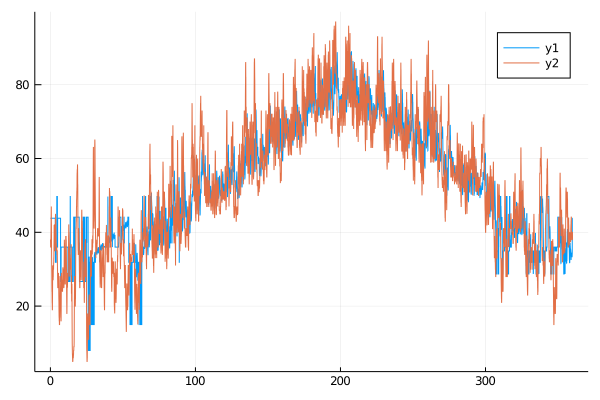

In [31]:
plot((1/24):(1/24):360, z)
plot!((1/24):(1/24):360, y2)

In [30]:
size(0:(1/24):360)

(8641,)

In [29]:
(train_X2, train_y2), (test_X2, test_y2) = IAI.split_data(:regression, X2, y2);
IAI.score(lnr, test_X2, test_y2)  # Testing on the next year

0.7833334351154271